In [1]:
import pandas as pd
from sklearn.preprocessing import PowerTransformer
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from pathlib import Path
from matplotlib.lines import Line2D 

In [2]:
ruta='../data/processed/df_max.xlsx'

In [3]:
ruta='../data/processed/df_mean.xlsx'

In [3]:
features = ['VAR_STD', 'Range', 'Energy', 'Peak_to_Peak', 'VAR', 'Max', 'MNF', 'SSC']
signal_cols = [f'Channel {ch}_{feat}' for ch in range(1, 9) for feat in features]

In [9]:
intact=pd.read_excel(ruta)
intact.head(10)

,origin_db,subject,stimulus,Channel 1_VAR_STD,Channel 2_VAR_STD,Channel 3_VAR_STD,Channel 4_VAR_STD,Channel 5_VAR_STD,Channel 6_VAR_STD,Channel 7_VAR_STD,...,Channel 7_MNF,Channel 8_MNF,Channel 1_SSC,Channel 2_SSC,Channel 3_SSC,Channel 4_SSC,Channel 5_SSC,Channel 6_SSC,Channel 7_SSC,Channel 8_SSC
0,NinaProDB1,1,0,28.991368,12.935956,43.790300,8.455451,0.710315,0.877439,60.235039,...,34189.809891,16623.688090,10883.333333,1096.000000,5070.083333,1970.000000,4216.083333,911.583333,13913.083333,20087.750000
1,NinaProDB1,1,22,1.556622,8.491342,4.807763,0.657234,0.052948,0.126834,6.225271,...,216.338318,153.986437,139.166667,118.000000,143.750000,92.916667,93.333333,97.500000,158.416667,161.583333
2,NinaProDB1,1,25,2.335566,1.654429,2.529078,1.077355,0.065492,0.079775,14.299958,...,196.925029,153.904745,137.333333,93.000000,124.750000,111.333333,81.166667,89.000000,163.166667,168.916667
3,NinaProDB1,1,27,5.408909,3.989522,8.206502,0.474338,0.058332,0.503866,8.516195,...,208.520234,150.899472,145.916667,133.916667,142.500000,98.000000,97.083333,107.833333,157.500000,151.916667
4,NinaProDB1,1,30,18.827876,35.048381,17.412131,3.460524,0.128043,0.105301,15.995140,...,206.973507,148.802810,151.416667,122.916667,140.083333,91.833333,112.083333,101.500000,168.666667,158.916667
5,NinaProDB1,1,31,0.186208,1.404981,6.669579,0.207704,0.078409,0.018098,1.257786,...,170.885424,135.944500,117.416667,102.916667,126.833333,68.416667,104.166667,84.250000,146.916667,161.000000
6,NinaProDB1,1,37,4.698855,11.278910,8.322564,0.551235,0.086173,0.099120,13.222737,...,185.293766,135.865234,168.583333,156.250000,155.333333,127.500000,108.000000,106.750000,183.416667,176.666667
7,NinaProDB1,1,40,2.684434,4.775975,2.128008,0.281541,0.133125,0.058017,9.484576,...,198.059376,151.633808,166.666667,153.916667,113.416667,85.500000,120.000000,100.166667,164.500000,187.000000
8,NinaProDB1,2,0,179.530483,245.780416,17.554612,5.215483,4.685449,0.211683,3.785810,...,27811.712953,26581.439480,24984.916667,26526.916667,16932.416667,1668.583333,4446.666667,739.583333,4595.916667,17078.833333
9,NinaProDB1,2,22,6.202012,5.600629,3.404330,4.016881,0.735533,0.044318,1.744201,...,245.010358,167.765594,181.833333,170.250000,145.666667,121.000000,103.333333,78.750000,123.250000,178.083333


In [ ]:
# def normalize_by_subject_only(df, signal_cols):
#     """
#     Aplica únicamente Z-score (StandardScaler) por sujeto.
#     Útil para comparar el impacto de la transformación de potencia
#     frente a una normalización lineal simple.
#     """
#     df_res = df.copy()
    
#     for (subj, db), group in df.groupby(['subject', 'origin_db']): # agrupamos los datos según Sujeto y DB
#         idx = group.index # filas del grupo actual
#         sub_data = df_res.loc[idx, signal_cols].values.astype(float) # volver a escribir los resultados exactamente en esas filas
#         # aseguramos que todos los valores sean flotantes.
        
#         # Manejo de casos con menos de 2 muestras o varianza cero
#         if sub_data.shape[0] < 2: # si tenemos menos muestras no se puede calcular std
#             df_res.loc[idx, signal_cols] = 0.0
#             continue

#         # Calculamos media y std ingnorando los nan
#         means = np.nanmean(sub_data, axis=0) # media por columnas
#         stds = np.nanstd(sub_data, axis=0, ddof=1) # ddof=1 usa la desviación estándar muestral
        
#         # Evitar división por cero si la señal es constante
#         stds[stds == 0] = 1.0 
        
#         # Aplicar Z-score: (x - mu) / sigma
#         df_res.loc[idx, signal_cols] = (sub_data - means) / stds
        
#     return df_res

In [6]:
def normalize_by_subject_only(df, signal_cols):
    """
    Aplica únicamente Z-score (StandardScaler) por sujeto.

    La normalización se realiza dentro de cada combinación
    (subject, origin_db), de forma que cada sujeto quede
    centrado en media 0 y escalado a desviación estándar 1.

    Fórmula:

        z = (x - media) / std

    donde media y std se calculan únicamente con las muestras
    del sujeto dentro de su base de datos.
    """

    # Trabajamos sobre una copia para no modificar
    # accidentalmente el DataFrame original
    df_res = df.copy()

    # Agrupamos los datos según Sujeto y DB
    for (subj, db), group in df.groupby(
        ['subject', 'origin_db']
    ):

        # Filas pertenecientes al grupo actual
        idx = group.index

        # Extraemos únicamente las señales a normalizar
        # y aseguramos que los datos sean float
        sub_data = (
            df_res.loc[idx, signal_cols]
            .values
            .astype(float)
        )

        # Si tenemos menos de 2 muestras no es posible
        # estimar correctamente una desviación estándar
        if sub_data.shape[0] < 2:

            # Dejamos todas las señales en 0
            # para evitar errores posteriores
            df_res.loc[idx, signal_cols] = 0.0
            continue

        # Calculamos media por columna ignorando NaN
        means = np.nanmean(sub_data, axis=0)

        # Calculamos desviación estándar muestral
        # (ddof=1 => divisor n-1)
        stds = np.nanstd(
            sub_data,
            axis=0,
            ddof=1
        )

        # Si alguna señal es constante:
        #
        #   [70,70,70,70]
        #
        # su desviación es cero.
        # Evitamos divisiones por cero sustituyendo
        # esos casos por 1.
        stds[stds == 0] = 1.0

        # Aplicamos normalización Z-score
        #
        # z = (x - media) / std
        #
        # NumPy realiza el cálculo columna a columna.
        normalized = (sub_data - means) / stds

        # Guardamos los resultados exactamente
        # en las mismas filas del grupo
        df_res.loc[idx, signal_cols] = normalized

    return df_res

In [27]:
def boxcox_normalize(df, signal_cols):
    df_res = df.copy()
    
    for (subj, db), group in df.groupby(['subject', 'origin_db']):
        idx = group.index
        
        # 1. Shift por sujeto: Box-Cox requiere valores > 0
        # Calculamos el mínimo de las columnas de señal para este sujeto específicamente
        sub_data = df_res.loc[idx, signal_cols].values.astype(float)
        
        # Para cada columna, si hay valores <= 0, desplazamos
        # Sumamos 1.0 para evitar que el valor mínimo sea exactamente 0
        min_vals = np.nanmin(sub_data, axis=0)
        shift = np.where(min_vals <= 0, -min_vals + 1.0, 0)
        
        shifted_data = sub_data + shift
        
        # 2. Transformación + Z-score (standardize=True)
        # El fit se hace solo con los datos desplazados de ESTE sujeto
        transformer = PowerTransformer(method='box-cox', standardize=True)
        df_res.loc[idx, signal_cols] = transformer.fit_transform(shifted_data)
        
    return df_res

In [28]:
def yeoJohnson_normalize(df, signal_cols):
    df_res = df.copy()
    
    for (subj, db), group in df.groupby(['subject', 'origin_db']):
        idx = group.index
        
        # standardize=True hace la transformación de potencia + Z-score 
        # usando SOLAMENTE los datos de este sujeto.
        transformer = PowerTransformer(method='yeo-johnson', standardize=True)
        df_res.loc[idx, signal_cols] = transformer.fit_transform(df_res.loc[idx, signal_cols])
        
    return df_res

In [ ]:
intact_n=normalize_by_subject_only(intact, signal_cols)

In [29]:
df_boxcox_intact = boxcox_normalize(intact, signal_cols)
df_yeojohnson_intact = yeoJohnson_normalize(intact, signal_cols)

In [41]:
df_boxcox_intact.to_csv('../data/master/intact_boxcox.csv', index=False)
df_yeojohnson_intact.to_csv('../data/master/intact_yeojohnson.csv', index=False)

In [30]:
def plot_histograms_by_channel(df, title):
    features = ['VAR_STD', 'Range', 'Energy', 'Peak_to_Peak', 'VAR', 'Max', 'MNF', 'SSC']
    fig, axes = plt.subplots(2, 4, figsize=(20, 10))
    fig.suptitle(title, fontsize=16)
    for i, feat in enumerate(features):
        ax = axes[i // 4][i % 4]
        vals = df[[f'Channel {ch}_{feat}' for ch in range(1, 9)]].values.flatten()
        sns.histplot(vals, kde=True, ax=ax, bins=20, color='steelblue')
        ax.set_title(feat, fontsize=12)
        ax.set_xlabel('')
    plt.tight_layout()
    plt.show()

In [31]:
def get_features_summary_table(df):
    features = ['VAR_STD', 'Range', 'Energy', 'Peak_to_Peak', 'VAR', 'Max', 'MNF', 'SSC']
    summary_data = []
    
    for feat in features:
        # 1. Extraer y aplanar los datos de los 8 canales para este feature
        # Esto es la misma lógica que usaste en plot_histograms_by_channel
        cols = [f'Channel {ch}_{feat}' for ch in range(1, 9)]
        
        # Verificamos que las columnas existan en el df para evitar errores
        cols_existing = [c for c in cols if c in df.columns]
        vals = df[cols_existing].values.flatten()
        
        # Limpiamos valores NaN para que no afecten los cálculos
        vals = vals[~np.isnan(vals)]
        
        # 2. Calcular estadísticas
        v_min = np.min(vals)
        v_max = np.max(vals)
        v_mean = np.mean(vals)
        v_std = np.std(vals)
        v_range = v_max - v_min
        
        summary_data.append({
            'Característica': feat,
            'Mín': v_min,
            'Máx': v_max,
            'Rango': v_range,
            'Media': v_mean,
            'Desv. Est.': v_std
        })
    
    # 3. Crear DataFrame y renombrar columnas
    df_summary = pd.DataFrame(summary_data)

    return df_summary

In [32]:
## 7. Distribución por estímulo
from matplotlib.lines import Line2D

def plot_kde_by_channel(df, feature, title):
    # Orden y colores fijos para que todos los canales coincidan
    stimuli = sorted(df['stimulus'].unique())
    n = len(stimuli)
    colors = sns.color_palette('Set2' if n <= 8 else 'husl', n)
    palette = dict(zip(stimuli, colors))

    fig, axes = plt.subplots(2, 4, figsize=(20, 10))

    for ch in range(1, 9):
        ax = axes[(ch - 1) // 4][(ch - 1) % 4]
        col = f'Channel {ch}_{feature}'
        df_plot = df[['stimulus']].copy()
        df_plot['value'] = df[col].values

        sns.kdeplot(data=df_plot, x='value', hue='stimulus',
                    hue_order=stimuli, palette=palette,
                    ax=ax, fill=False, linewidth=2, legend=False)
        ax.set_title(f'Channel {ch}', fontsize=12)
        ax.set_xlabel('')
        ax.set_ylabel('')

    # Leyenda única, centrada arriba
    handles = [Line2D([0], [0], color=palette[s], lw=2) for s in stimuli]
    fig.suptitle(f'{title} — {feature}', fontsize=16, y=0.99)
    fig.legend(handles, stimuli, title='Estímulo',
               loc='upper center', bbox_to_anchor=(0.5, 0.95),
               ncol=min(n, 10), frameon=False, fontsize=11, title_fontsize=12)

    # Deja espacio arriba para el título y la leyenda
    plt.tight_layout(rect=[0, 0, 1, 0.88])
    plt.show()

# Intact

## Original

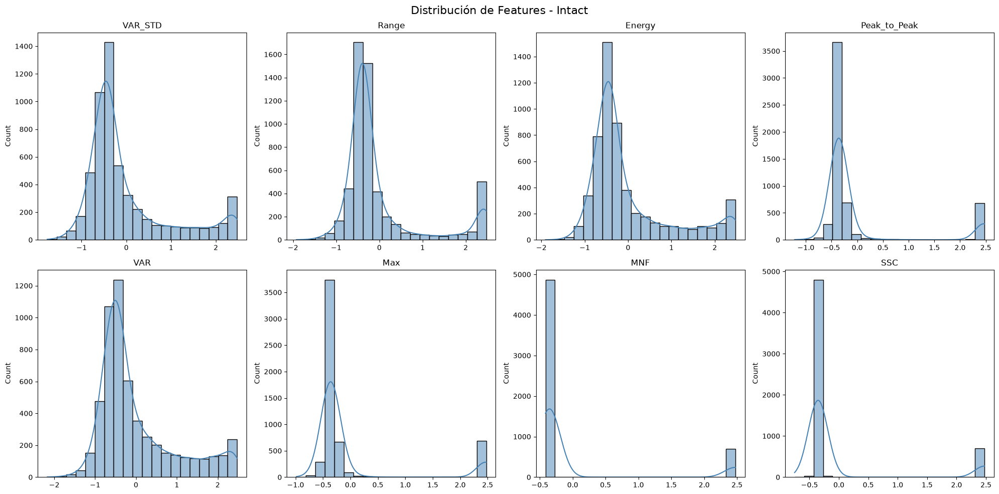

In [42]:
plot_histograms_by_channel(intact, 'Distribución de Features - Intact')

In [34]:
get_features_summary_table(intact)

,Característica,Mín,Máx,Rango,Media,Desv. Est.
0,VAR_STD,1.330848e-12,1.011326e+09,1.011326e+09,3.501593e+06,2.680715e+07
1,Range,4.079969e-07,4.395762e+04,4.395762e+04,4.485890e+02,2.205732e+03
2,Energy,4.843963e-10,1.545454e+11,1.545454e+11,7.237982e+08,4.877203e+09
3,Peak_to_Peak,2.885163e-05,7.864059e+06,7.864059e+06,3.174659e+04,2.502199e+05
4,VAR,6.807607e-16,4.523005e+06,4.523005e+06,9.187735e+03,8.484769e+04
5,Max,5.702268e-06,9.472572e+05,9.472572e+05,4.953335e+03,3.458640e+04
6,MNF,9.029064e+01,1.084426e+06,1.084336e+06,5.056959e+04,1.633119e+05
7,SSC,1.700000e+01,6.064776e+05,6.064606e+05,2.928176e+04,9.661919e+04


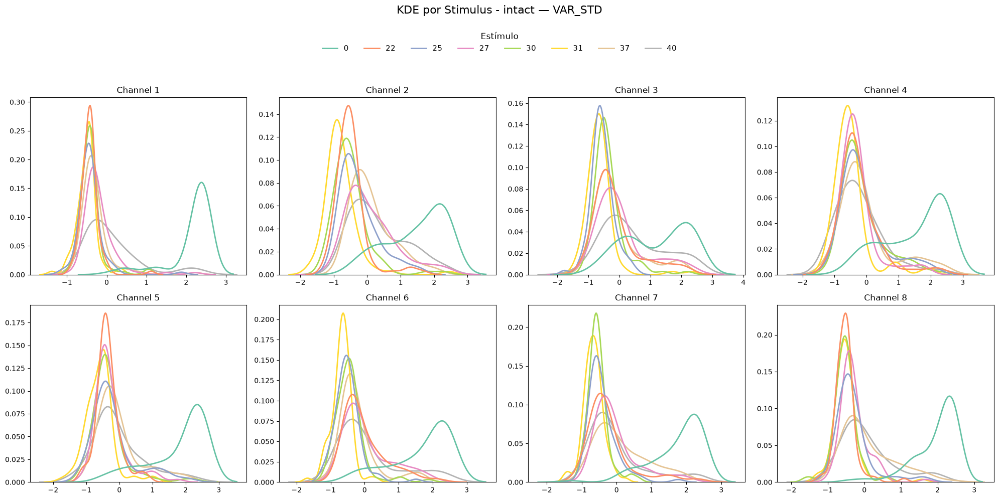

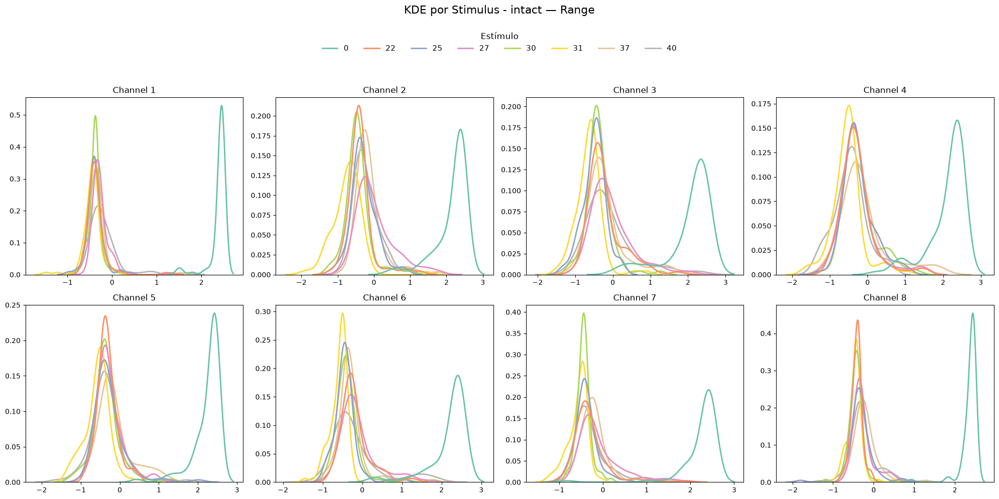

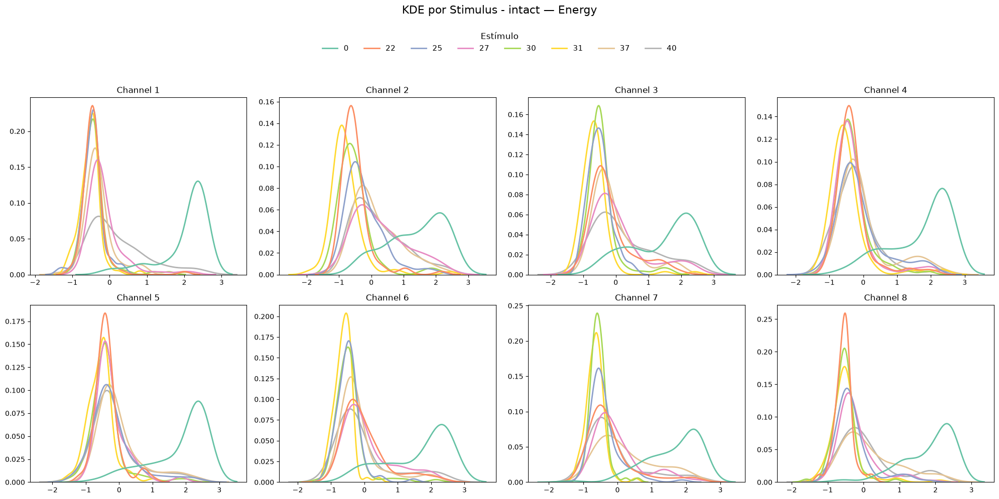

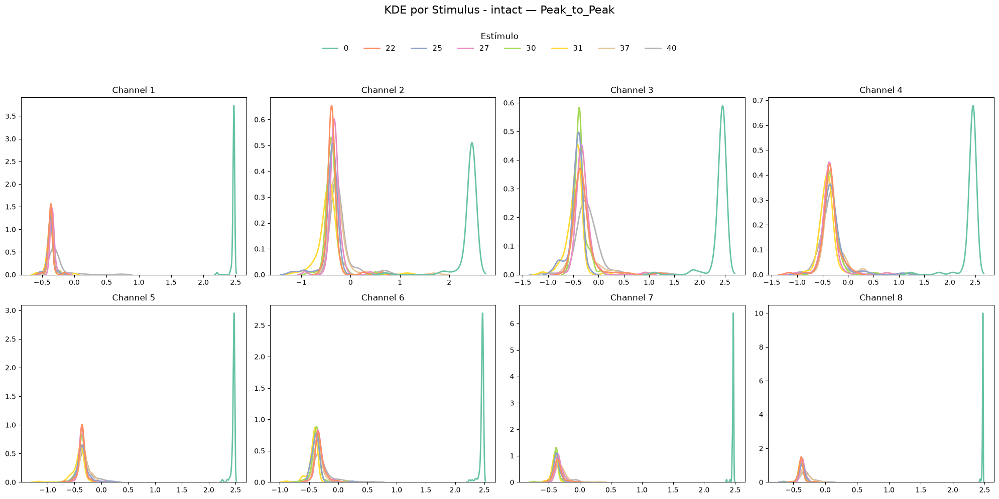

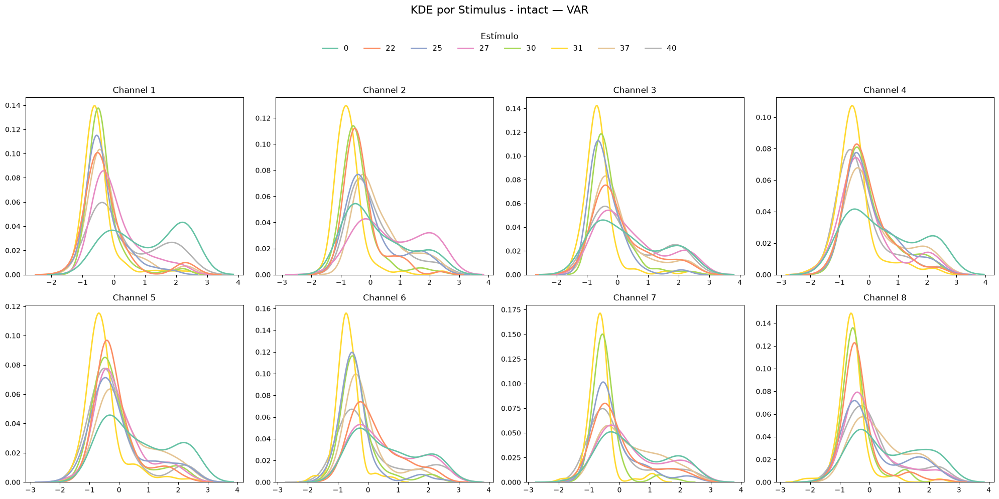

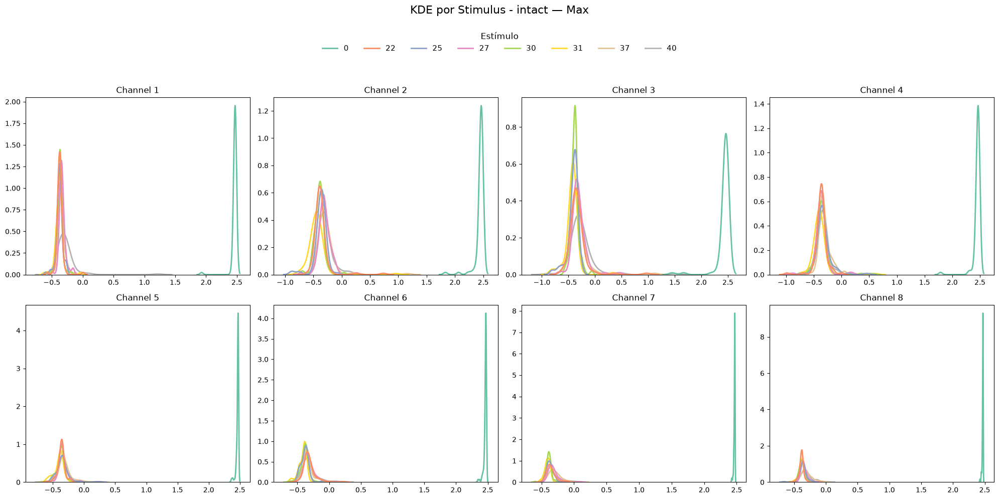

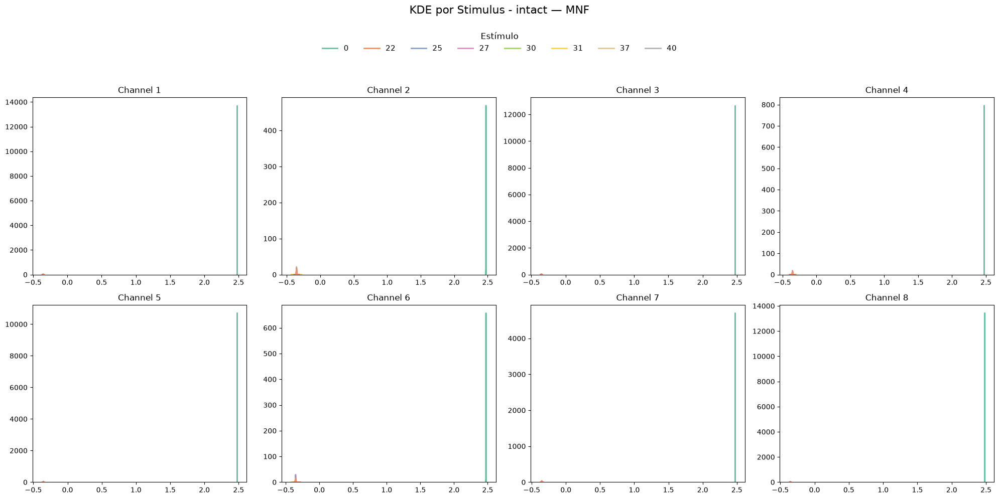

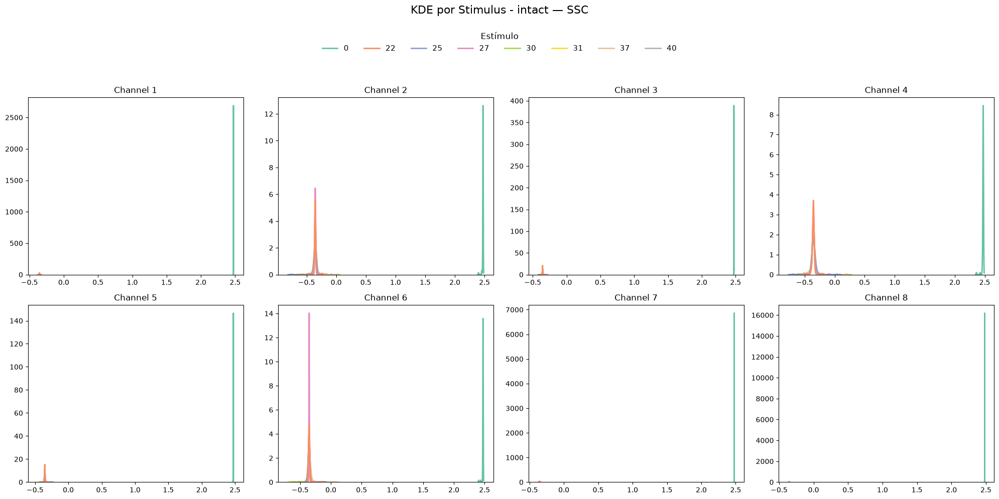

In [43]:
features = ['VAR_STD', 'Range', 'Energy', 'Peak_to_Peak', 'VAR', 'Max', 'MNF', 'SSC']
for feat in features:
        plot_kde_by_channel(intact, feat, f'KDE por Stimulus - intact')

## Box-cox Transformation

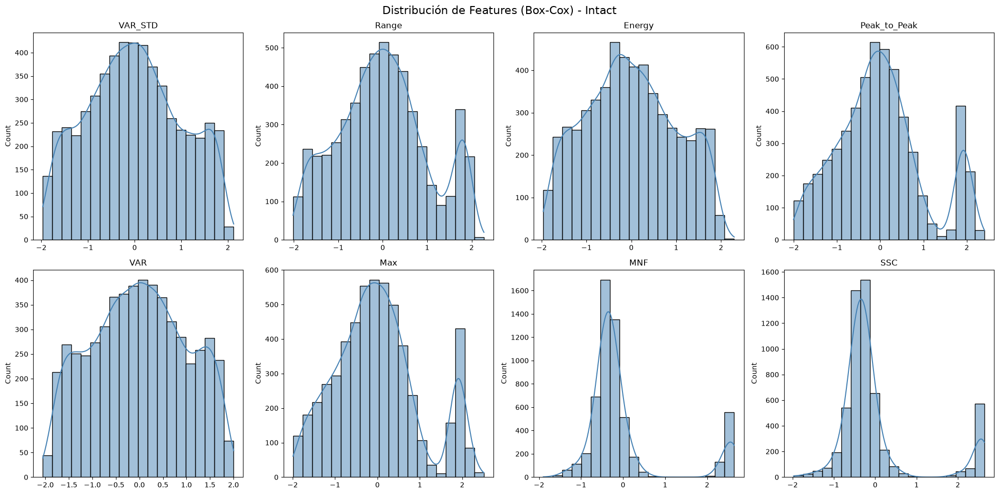

In [36]:
plot_histograms_by_channel(df_boxcox_intact, 'Distribución de Features (Box-Cox) - Intact')

In [37]:
get_features_summary_table(df_boxcox_intact)

,Característica,Mín,Máx,Rango,Media,Desv. Est.
0,VAR_STD,-1.968458,2.123176,4.091634,2.766388e-12,1.000000
1,Range,-2.018189,2.276242,4.294431,9.064990e-13,1.000000
2,Energy,-1.962612,2.293537,4.256150,1.915310e-07,1.000000
3,Peak_to_Peak,-2.004298,2.406892,4.411190,-7.873644e-13,1.000000
4,VAR,-2.054527,2.004321,4.058848,2.597261e-08,0.999281
5,Max,-1.990489,2.511946,4.502435,-1.248545e-12,1.000000
6,MNF,-1.898631,2.644053,4.542684,1.258612e-11,1.000000
7,SSC,-1.977200,2.644099,4.621300,-6.961149e-13,1.000000


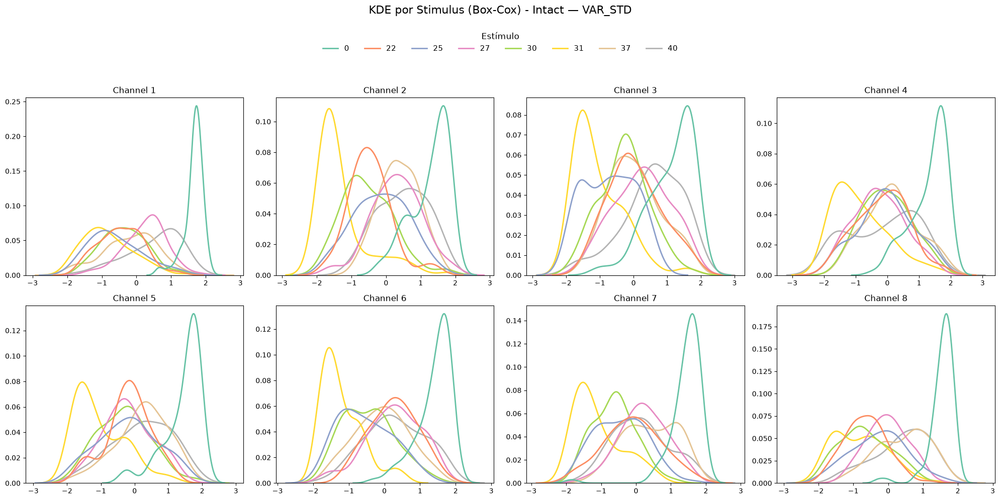

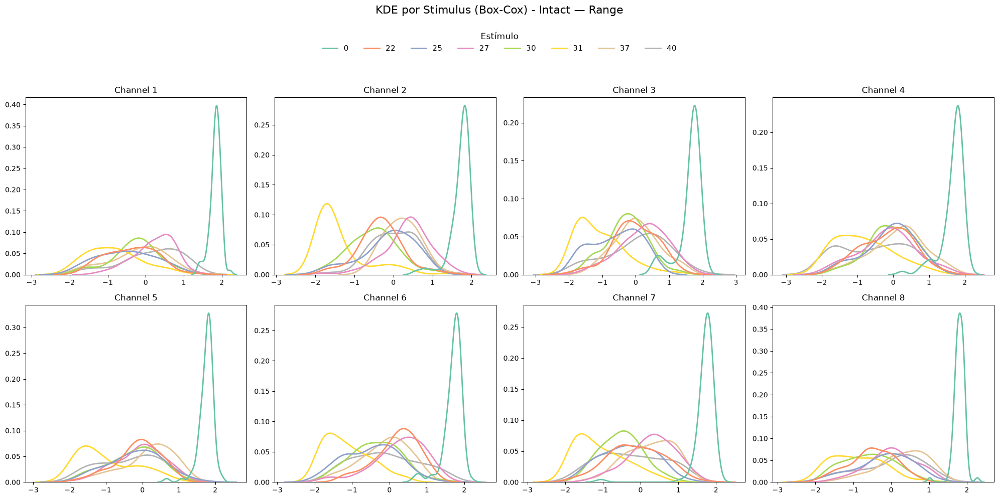

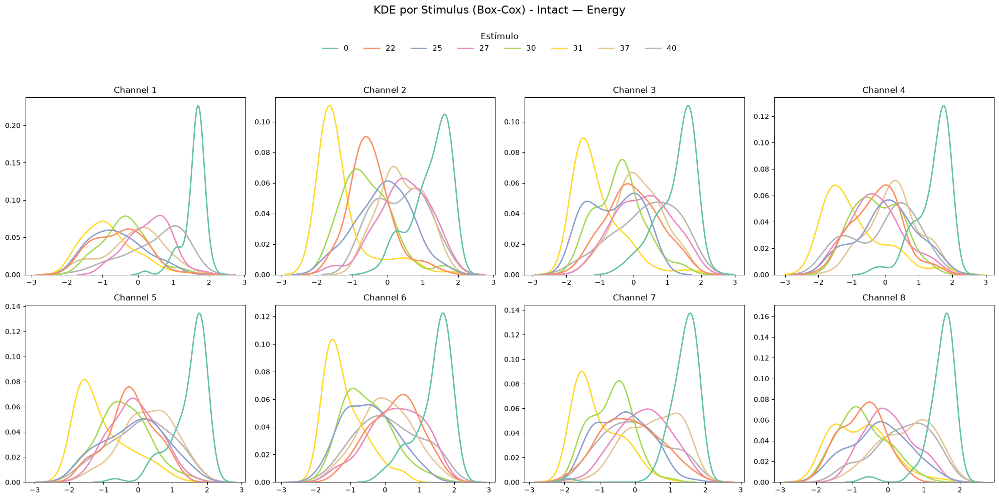

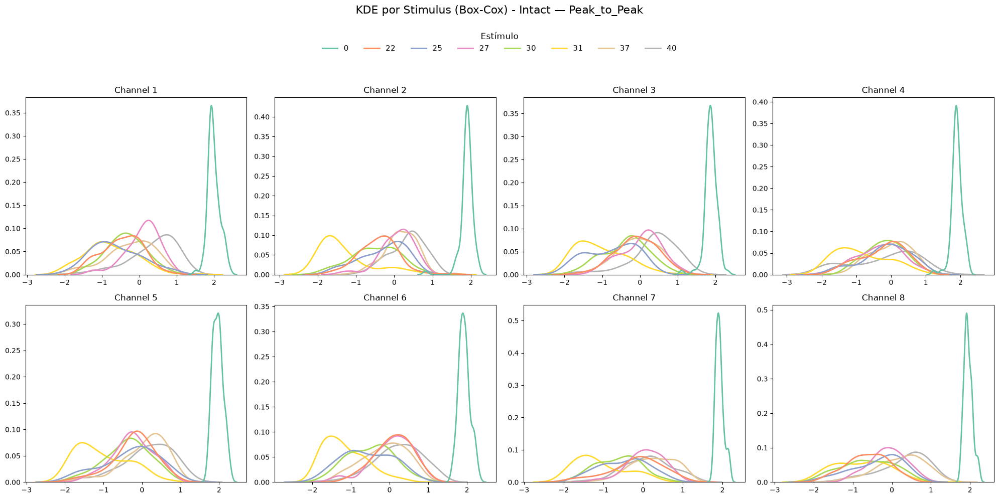

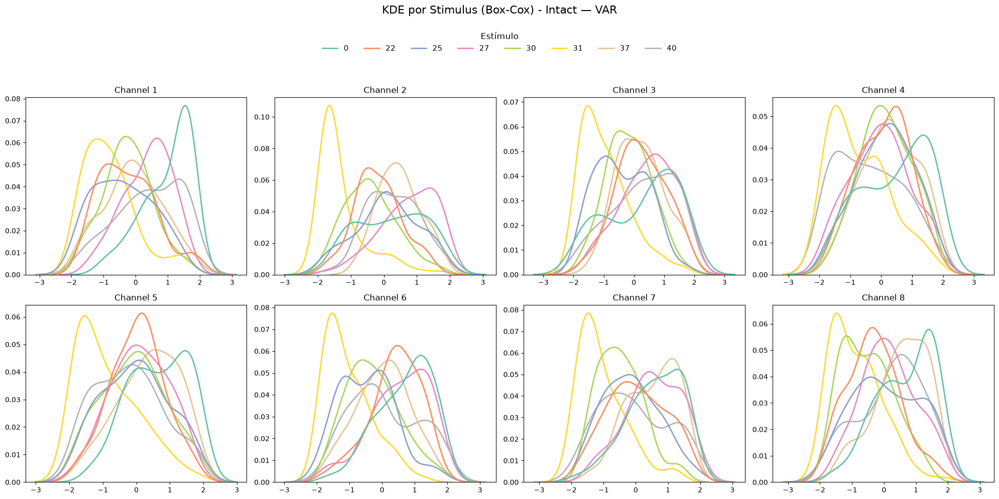

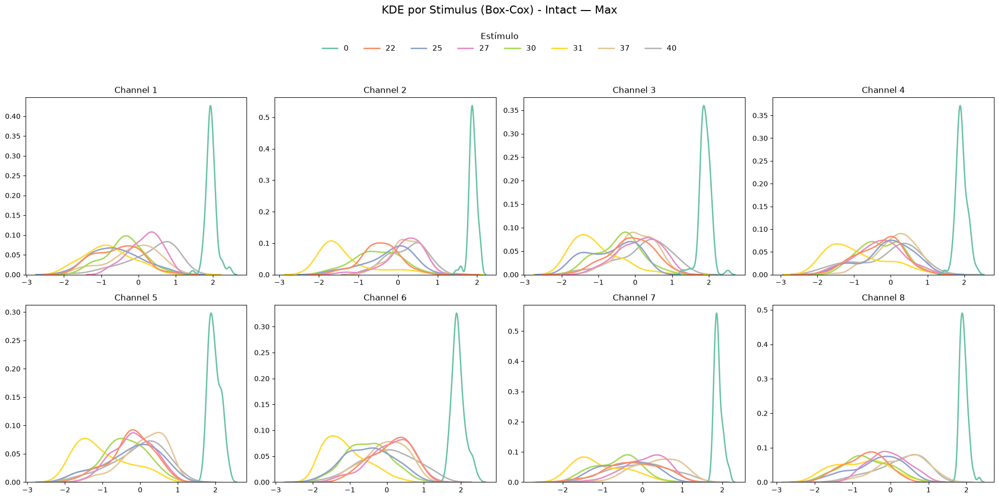

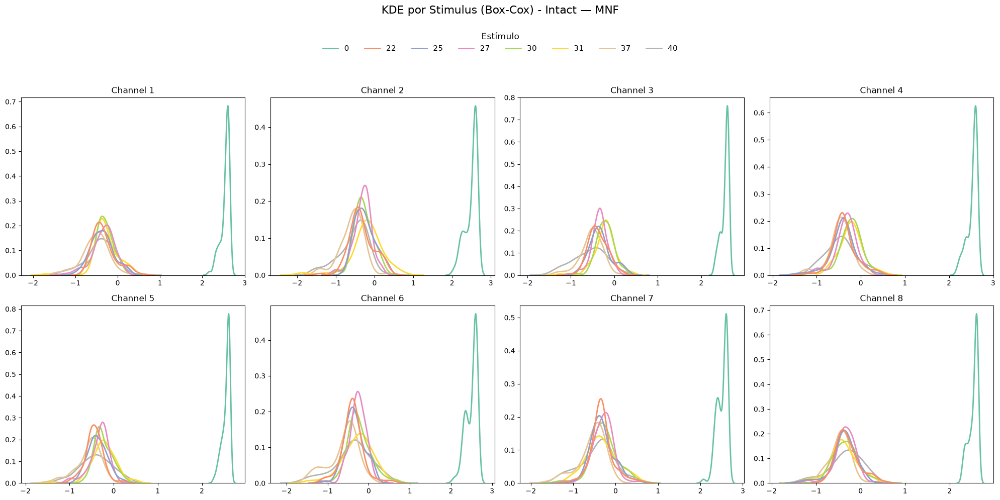

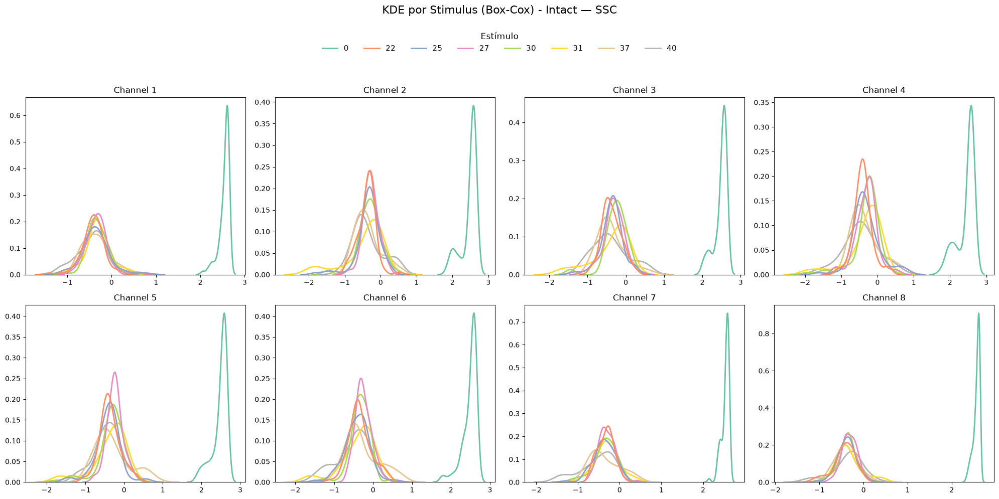

In [38]:
features = ['VAR_STD', 'Range', 'Energy', 'Peak_to_Peak', 'VAR', 'Max', 'MNF', 'SSC']
for feat in features:
        plot_kde_by_channel(df_boxcox_intact, feat, f'KDE por Stimulus (Box-Cox) - Intact')

## Yeo-Johnson Transformation

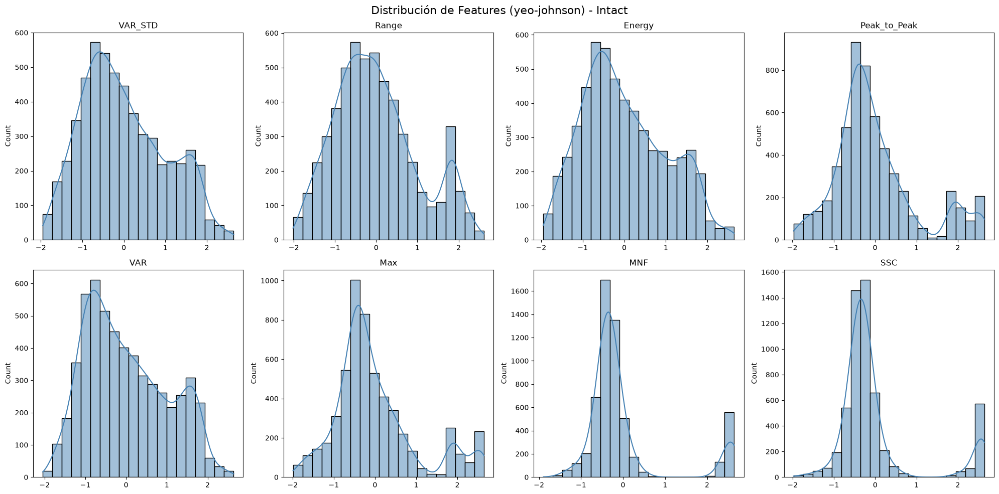

In [39]:
plot_histograms_by_channel(df_yeojohnson_intact, 'Distribución de Features (yeo-johnson) - Intact')

In [24]:
get_features_summary_table(df_yeojohnson_intact)

,Característica,Mín,Máx,Rango,Media,Desv. Est.
0,VAR_STD,1.330848e-12,4.902318,4.902318,1.203198,1.589720
1,Range,4.079968e-07,2.945787,2.945787,0.779750,0.917570
2,Energy,4.843963e-10,9.919946,9.919946,2.716489,3.002666
3,Peak_to_Peak,2.885109e-05,4.746543,4.746514,1.355052,1.496272
4,VAR,6.807607e-16,2.027686,2.027686,0.366609,0.653925
5,Max,5.702247e-06,5.449440,5.449435,1.474507,1.584331
6,MNF,3.788482e+00,9.300165,5.511683,5.584936,1.067124
7,SSC,2.538847e+00,8.320105,5.781258,5.114471,1.025761


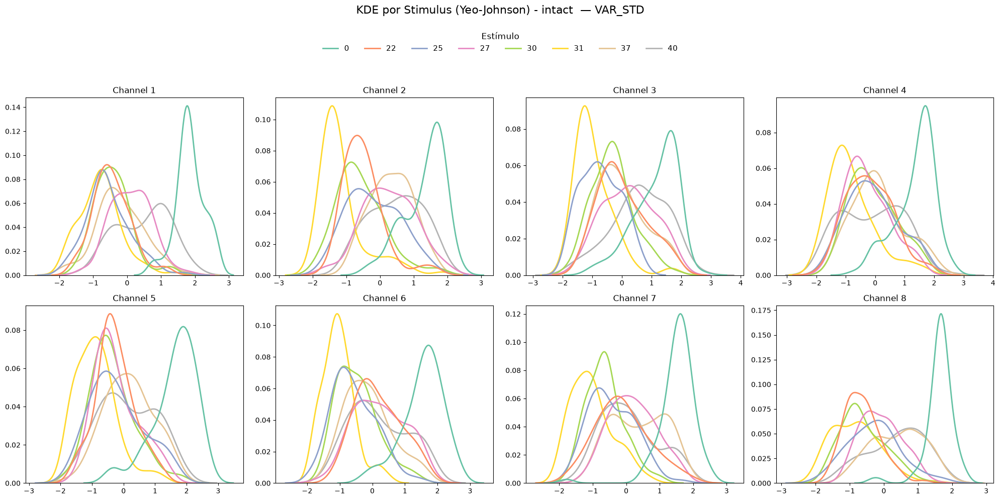

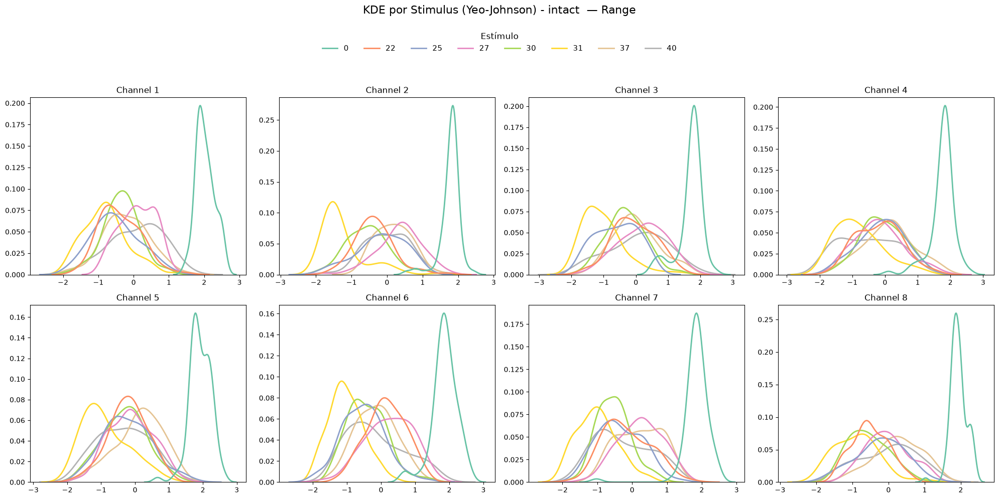

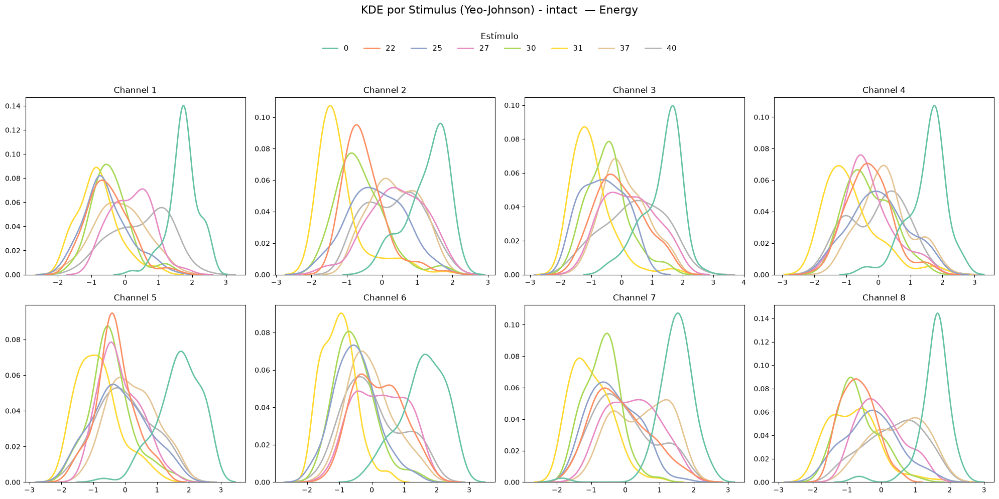

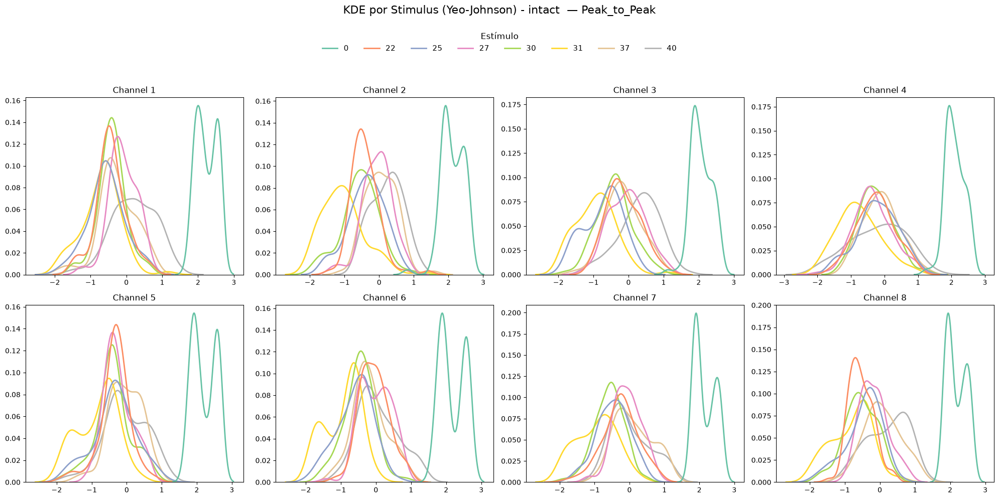

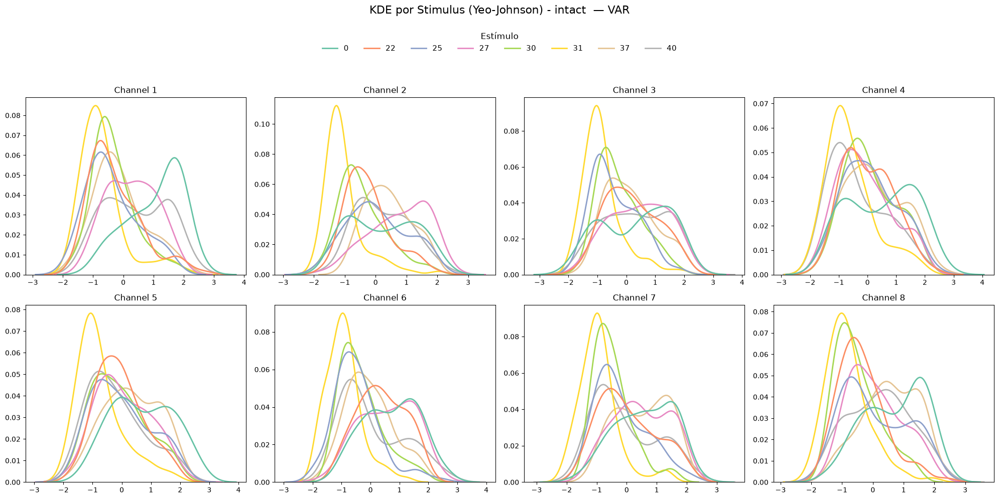

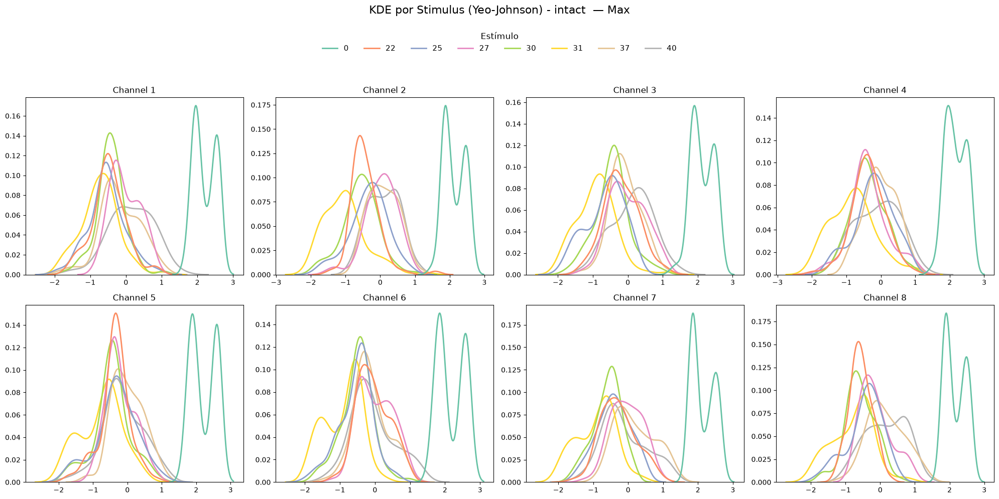

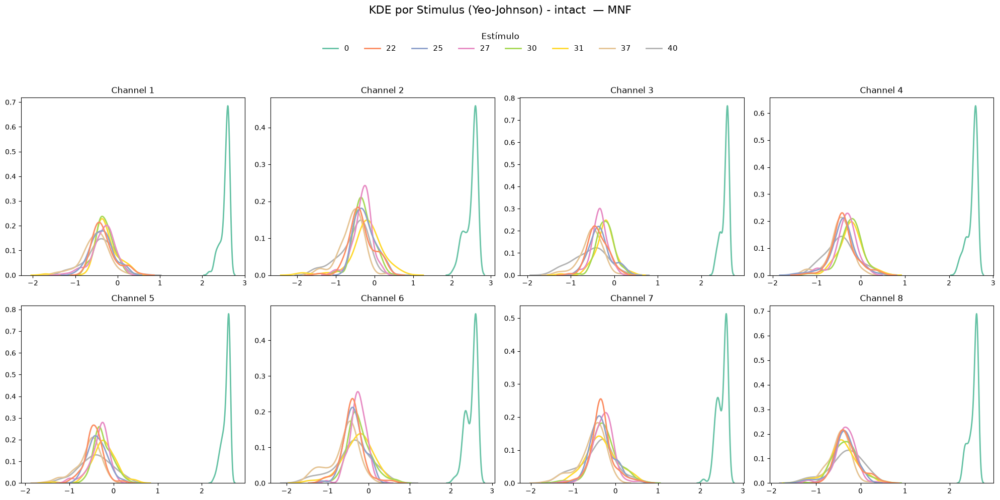

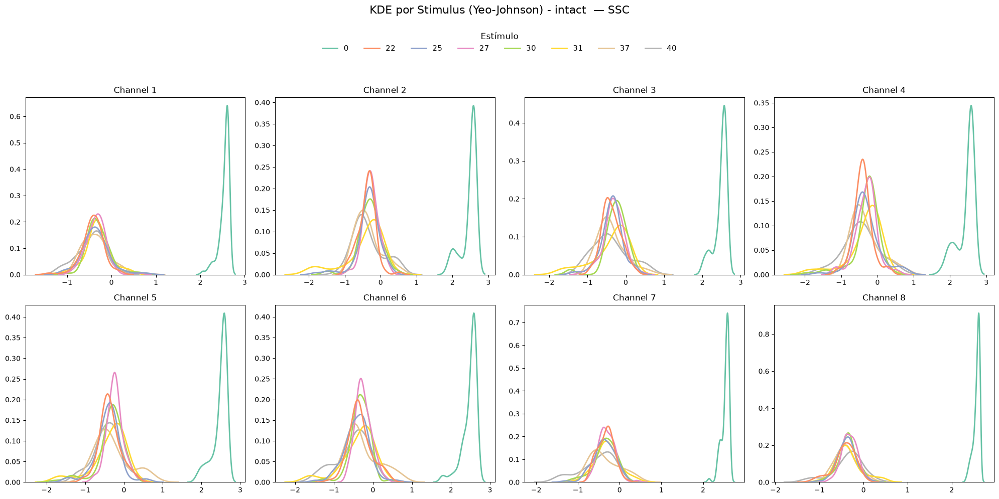

In [40]:
features = ['VAR_STD', 'Range', 'Energy', 'Peak_to_Peak', 'VAR', 'Max', 'MNF', 'SSC']
for feat in features:
        plot_kde_by_channel(df_yeojohnson_intact, feat, f'KDE por Stimulus (Yeo-Johnson) - intact ')

## Guardado de todas las gráficas

El siguiente bloque crea `figures/transformation/` y organiza las gráficas en las carpetas `original`, `box_cox` y `yeo_johnson`.

In [54]:
output_dir = Path('../figures/transformation')
OVERWRITE = True  # ponlo en False para saltar las figuras que ya existen

# Orden y colores de estímulos fijos para todas las figuras
stimuli = sorted(intact['stimulus'].unique())
n_stim = len(stimuli)
stim_palette = dict(zip(
    stimuli,
    sns.color_palette('Set2' if n_stim <= 8 else 'husl', n_stim)
))


def save_histogram(df, title, output_path, overwrite=False):
    if output_path.exists() and not overwrite:
        return

    fig, axes = plt.subplots(2, 4, figsize=(20, 10))
    fig.suptitle(title, fontsize=16)

    for index, feature in enumerate(features):
        ax = axes[index // 4][index % 4]
        values = df[[f'Channel {channel}_{feature}' for channel in range(1, 9)]].to_numpy().flatten()
        values = values[~np.isnan(values)]
        sns.histplot(values, kde=True, ax=ax, bins=20, color='steelblue')
        ax.set_title(feature, fontsize=12)
        ax.set_xlabel('')

    fig.subplots_adjust(top=0.90, wspace=0.25, hspace=0.30)
    fig.savefig(output_path, dpi=150)
    plt.close(fig)


def save_kde_by_channel(df, feature, title, output_path, overwrite=False):
    if output_path.exists() and not overwrite:
        return

    fig, axes = plt.subplots(2, 4, figsize=(20, 10))

    for channel in range(1, 9):
        ax = axes[(channel - 1) // 4][(channel - 1) % 4]
        column = f'Channel {channel}_{feature}'
        df_plot = df[['stimulus', column]].rename(columns={column: 'value'})
        sns.kdeplot(
            data=df_plot,
            x='value',
            hue='stimulus',
            hue_order=stimuli,
            palette=stim_palette,
            ax=ax,
            fill=False,
            linewidth=2,
            legend=False
        )
        ax.set_title(f'Channel {channel}', fontsize=12)
        ax.set_xlabel('')
        ax.set_ylabel('')

    # Título y leyenda única centrada arriba
    fig.suptitle(f'{title} - {feature}', fontsize=16, y=0.99)
    handles = [Line2D([0], [0], color=stim_palette[s], lw=2) for s in stimuli]
    fig.legend(
        handles, stimuli,
        title='Estímulo',
        loc='upper center',
        bbox_to_anchor=(0.5, 0.955),
        ncol=min(n_stim, 10),
        frameon=False,
        fontsize=11,
        title_fontsize=12
    )

    fig.subplots_adjust(top=0.85, wspace=0.25, hspace=0.30)
    fig.savefig(output_path, dpi=150, bbox_inches='tight')
    plt.close(fig)


datasets = {
    'original': intact,
    'box_cox': df_boxcox_intact,
    'yeo_johnson': df_yeojohnson_intact,
}

for dataset_name, dataset in datasets.items():
    dataset_dir = output_dir / dataset_name
    dataset_dir.mkdir(parents=True, exist_ok=True)

    save_histogram(
        dataset,
        f'Distribución de Features - {dataset_name}',
        dataset_dir / 'histogramas.png',
        overwrite=OVERWRITE
    )

    for feature in features:
        save_kde_by_channel(
            dataset,
            feature,
            f'KDE por Stimulus - {dataset_name}',
            dataset_dir / f'kde_{feature.lower()}.png',
            overwrite=OVERWRITE
        )

print(f'Gráficas guardadas en: {output_dir.resolve()}')

Gráficas guardadas en: /home/Felixphz/project/sEMG-ArmBand/figures/transformation


In [5]:
intact.to_csv('../data/master/intact.csv', index=False)